# Deep learning Spring 2025

- **Name:** `Ali Zahedzadeh`
- **Student ID:** `4021305965003`



---



- **Name:** `Peyman Naseri`
- **Student ID:** `4011305965014`



### **<font face="Courier New" color="blue" size="+3">Question 2: Deep Convolutional Generative Adversarial Networks (DCGANs)**



#### <font face="Verdana" color="green" size="+2">**Part 1: Setup and Model Definitions**




In [ ]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import make_grid

# Set random seeds for reproducibility
def set_random_seeds(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.deterministic = True

set_random_seeds()

# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Hyperparameters
batch_size = 64
latent_dim = 100
num_epochs = 50  # Reduced for demonstration
lr = 0.0002
beta1 = 0.5
image_size = 32
num_classes = 5

Using device: cuda


#### <font face="Verdana" color="green" size="+2">**Part 2: Define Generator and Discriminator Models**




In [ ]:
# Define weights initialization function as per DCGAN paper
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Generator matching the paper's architecture for 32x32 grayscale images
class Generator(nn.Module):
    def __init__(self, latent_dim=100, num_classes=5):
        super(Generator, self).__init__()
        self.latent_dim = latent_dim
        self.num_classes = num_classes

        # Input processing for latent vector and class
        self.latent_dense = nn.Linear(latent_dim, 4*4*512, bias=False)
        self.class_embedding = nn.Embedding(num_classes, 50)  # Embed class labels
        self.class_dense = nn.Linear(50, 4*4*512, bias=False)

        # Main generator architecture
        self.main = nn.Sequential(
            # Input shape after reshape: 4x4x512
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            # Layer 1: Output shape: 8x8x256
            nn.ConvTranspose2d(512, 256, kernel_size=5, stride=2, padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            # Layer 2: Output shape: 16x16x128
            nn.ConvTranspose2d(256, 128, kernel_size=5, stride=2, padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # Layer 3: Output shape: 32x32x1
            nn.ConvTranspose2d(128, 1, kernel_size=5, stride=2, padding=2, output_padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, noise, labels):
        batch_size = noise.size(0)

        # Process latent vector
        x = self.latent_dense(noise)

        # Process class labels
        y = self.class_embedding(labels)
        y = self.class_dense(y)

        # Combine latent and class information
        x = x + y

        # Reshape for convolutions
        x = x.view(batch_size, 512, 4, 4)

        # Pass through main generator
        return self.main(x)

# Discriminator matching the paper's architecture for 32x32 grayscale images
class Discriminator(nn.Module):
    def __init__(self, num_classes=5):
        super(Discriminator, self).__init__()
        self.num_classes = num_classes

        # Class embedding
        self.class_embedding = nn.Embedding(num_classes, 50)
        self.class_dense = nn.Linear(50, 32*32)

        # Convolutional part
        self.conv_layers = nn.Sequential(
            # Layer 1: Input 32x32x2 -> Output 16x16x64
            # No batch norm in first layer
            nn.Conv2d(2, 64, kernel_size=5, stride=2, padding=2, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 2: Input 16x16x64 -> Output 8x8x128
            nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 3: Input 8x8x128 -> Output 4x4x256
            nn.Conv2d(128, 256, kernel_size=5, stride=2, padding=2, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
        )

        # Fully connected output layer
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(4*4*256, 1),
            nn.Sigmoid()
        )

    def forward(self, image, labels):
        batch_size = image.size(0)

        # Process class labels
        y = self.class_embedding(labels)
        y = self.class_dense(y)
        y = y.view(batch_size, 1, 32, 32)

        # Concatenate image and class information
        x = torch.cat([image, y], dim=1)

        # Pass through convolutional layers
        x = self.conv_layers(x)

        # Output layer
        return self.fc(x).view(-1)

#### <font face="Verdana" color="green" size="+2">**Part 3: Create Dataset and Data Loaders**




In [ ]:
# Custom dataset class for finger-drawn digits with "Class N" folder structure
class FingerDrawnDigitDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.images = []
        self.labels = []

        # Load images from each class folder - updated for "Class N" naming
        for class_idx in range(1, num_classes + 1):  # Starting from 1, not 0
            class_path = os.path.join(root_dir, f"Class {class_idx}")
            if os.path.isdir(class_path):
                files = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f)) and
                         f.lower().endswith(('.png', '.jpg', '.jpeg'))]
                for img_name in files:
                    self.images.append(os.path.join(class_path, img_name))
                    self.labels.append(class_idx - 1)  # Subtract 1 to get 0-based indices
                print(f"Loaded {len(files)} images for Class {class_idx}")

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        try:
            image = torchvision.io.read_image(img_path).float() / 255.0  # Normalize to [0,1]

            # If image is RGB, convert to grayscale
            if image.shape[0] == 3:
                image = 0.299 * image[0] + 0.587 * image[1] + 0.114 * image[2]
                image = image.unsqueeze(0)
            elif image.shape[0] > 1:
                # Take only first channel if more than 1 but not 3
                image = image[0].unsqueeze(0)

        except Exception as e:
            print(f"Error loading image {img_path}: {str(e)}")
            # Return a placeholder black image and the label
            image = torch.zeros((1, image_size, image_size), dtype=torch.float)

        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

# Define transformations
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize to [-1,1]
])

# Load the dataset - update with your actual path
dataset_path = r'digit5_data/Dataset'
dataset = FingerDrawnDigitDataset(root_dir=dataset_path, transform=transform)

# Check if dataset is loaded correctly
print(f"Dataset size: {len(dataset)} images")

# Split into training and validation sets (80% train, 20% validation)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size

# Handle edge case where dataset might be empty
if len(dataset) > 0:
    train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

    print(f"Training set: {len(train_dataset)} images")
    print(f"Validation set: {len(val_dataset)} images")
else:
    print("Error: Dataset is empty. Please check your dataset path.")

Loaded 201 images for Class 1
Loaded 201 images for Class 2
Loaded 201 images for Class 3
Loaded 201 images for Class 4
Loaded 201 images for Class 5
Dataset size: 1005 images
Training set: 804 images
Validation set: 201 images


#### <font face="Verdana" color="green" size="+2">**Part 4: Training Utilities**




In [ ]:
# Function to compute accuracy
def compute_accuracy(predictions, targets):
    return ((predictions > 0.5).float() == targets).float().mean().item()

# Function to display generated images for each class
def display_generated_images(generator, fixed_noise, class_labels):
    generator.eval()  # Set to evaluation mode
    with torch.no_grad():
        fake = generator(fixed_noise, class_labels)

    # Create a figure with subplots for each class
    fig, axs = plt.subplots(1, num_classes, figsize=(15, 3))

    # Display images for each class
    for c in range(num_classes):
        # Extract images of this class
        class_indices = (class_labels == c)
        if any(class_indices):
            fake_class = fake[class_indices][:16]  # Take up to 16 images
            grid = make_grid(fake_class.cpu(), normalize=True, nrow=4)

            # Display in the appropriate subplot
            axs[c].imshow(np.transpose(grid, (1, 2, 0)), cmap='gray')
            axs[c].set_title(f"Class {c}")
            axs[c].axis('off')

    plt.tight_layout()
    plt.show()

    generator.train()  # Set back to training mode

# Function to train for one epoch
def train_epoch(generator, discriminator, train_loader, optimizer_g, optimizer_d,
                criterion, epoch, label_smoothing=False, add_noise=False):
    generator.train()
    discriminator.train()

    running_d_loss = 0.0
    running_g_loss = 0.0
    running_d_acc = 0.0

    for i, (real_images, labels) in enumerate(train_loader):
        real_images = real_images.to(device)
        labels = labels.to(device)
        batch_size = real_images.size(0)

        # Train Discriminator
        discriminator.zero_grad()

        # Train with real images
        real_labels = torch.ones(batch_size, device=device)

        # Apply label smoothing if enabled
        if label_smoothing:
            real_labels = real_labels * 0.9  # One-sided label smoothing

        # Add noise to real images if enabled
        if add_noise:
            noise_factor = 0.05
            real_images = real_images + noise_factor * torch.randn_like(real_images)
            real_images = torch.clamp(real_images, -1, 1)

        d_output_real = discriminator(real_images, labels)
        d_loss_real = criterion(d_output_real, real_labels)

        # Train with fake images
        noise = torch.randn(batch_size, latent_dim, device=device)
        fake_images = generator(noise, labels)

        # Add noise to fake images if enabled
        if add_noise:
            fake_images = fake_images + noise_factor * torch.randn_like(fake_images)
            fake_images = torch.clamp(fake_images, -1, 1)

        fake_labels = torch.zeros(batch_size, device=device)
        d_output_fake = discriminator(fake_images.detach(), labels)
        d_loss_fake = criterion(d_output_fake, fake_labels)

        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optimizer_d.step()

        # Calculate accuracy
        d_acc_real = compute_accuracy(d_output_real, real_labels)
        d_acc_fake = compute_accuracy(d_output_fake, fake_labels)
        d_acc = (d_acc_real + d_acc_fake) / 2

        # Train Generator
        generator.zero_grad()

        # Generate fake images
        noise = torch.randn(batch_size, latent_dim, device=device)
        fake_images = generator(noise, labels)

        # Try to fool the discriminator
        g_labels = torch.ones(batch_size, device=device)
        g_output = discriminator(fake_images, labels)
        g_loss = criterion(g_output, g_labels)

        g_loss.backward()
        optimizer_g.step()

        # Update running losses
        running_d_loss += d_loss.item()
        running_g_loss += g_loss.item()
        running_d_acc += d_acc

        if i % 20 == 0:
            print(f"Epoch [{epoch}/{num_epochs}] Batch {i}/{len(train_loader)} "
                 f"D_loss: {d_loss.item():.4f}, G_loss: {g_loss.item():.4f}, "
                 f"D_acc: {d_acc:.4f}")

    # Calculate average losses for the epoch
    avg_d_loss = running_d_loss / len(train_loader)
    avg_g_loss = running_g_loss / len(train_loader)
    avg_d_acc = running_d_acc / len(train_loader)

    return avg_d_loss, avg_g_loss, avg_d_acc

# Function to evaluate on validation set
def evaluate(generator, discriminator, val_loader, criterion):
    generator.eval()
    discriminator.eval()

    running_d_loss = 0.0
    running_g_loss = 0.0
    running_d_acc = 0.0

    with torch.no_grad():
        for i, (real_images, labels) in enumerate(val_loader):
            real_images = real_images.to(device)
            labels = labels.to(device)
            batch_size = real_images.size(0)

            # Evaluate discriminator on real images
            real_labels = torch.ones(batch_size, device=device)
            d_output_real = discriminator(real_images, labels)
            d_loss_real = criterion(d_output_real, real_labels)

            # Evaluate discriminator on fake images
            noise = torch.randn(batch_size, latent_dim, device=device)
            fake_images = generator(noise, labels)
            fake_labels = torch.zeros(batch_size, device=device)
            d_output_fake = discriminator(fake_images.detach(), labels)
            d_loss_fake = criterion(d_output_fake, fake_labels)

            d_loss = d_loss_real + d_loss_fake

            # Calculate accuracy
            d_acc_real = compute_accuracy(d_output_real, real_labels)
            d_acc_fake = compute_accuracy(d_output_fake, fake_labels)
            d_acc = (d_acc_real + d_acc_fake) / 2

            # Evaluate generator
            g_labels = torch.ones(batch_size, device=device)
            g_output = discriminator(fake_images, labels)
            g_loss = criterion(g_output, g_labels)

            running_d_loss += d_loss.item()
            running_g_loss += g_loss.item()
            running_d_acc += d_acc

    # Calculate average losses for validation
    avg_d_loss = running_d_loss / len(val_loader)
    avg_g_loss = running_g_loss / len(val_loader)
    avg_d_acc = running_d_acc / len(val_loader)

    return avg_d_loss, avg_g_loss, avg_d_acc

# Function to plot loss curves
def plot_losses(train_g_losses, train_d_losses, val_g_losses, val_d_losses,
               train_d_accs, val_d_accs, title="Loss and Accuracy Curves"):
    plt.figure(figsize=(15, 10))

    # Plot generator and discriminator losses
    plt.subplot(2, 2, 1)
    plt.plot(train_g_losses, label='Generator Train')
    plt.plot(train_d_losses, label='Discriminator Train')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training Losses')

    plt.subplot(2, 2, 2)
    plt.plot(val_g_losses, label='Generator Validation')
    plt.plot(val_d_losses, label='Discriminator Validation')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Validation Losses')

    # Plot discriminator accuracy
    plt.subplot(2, 2, 3)
    plt.plot(train_d_accs, label='Train')
    plt.plot(val_d_accs, label='Validation')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Discriminator Accuracy')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

#### <font face="Verdana" color="green" size="+2">**Part 5: Main Training Function**




In [ ]:
# Modified training function to display generated images every 10 epochs
def train_dcgan(label_smoothing=False, add_noise=False):
    # Create new models for each run
    gen = Generator(latent_dim, num_classes).to(device)
    disc = Discriminator(num_classes).to(device)

    # Apply weights initialization
    gen.apply(weights_init)
    disc.apply(weights_init)

    # Setup optimizers
    opt_g = optim.Adam(gen.parameters(), lr=lr, betas=(beta1, 0.999))
    opt_d = optim.Adam(disc.parameters(), lr=lr, betas=(beta1, 0.999))

    # Loss function
    criterion = nn.BCELoss()

    # Reset metrics
    train_g_losses = []
    train_d_losses = []
    val_g_losses = []
    val_d_losses = []
    train_d_accs = []
    val_d_accs = []

    # Generate fixed noise for image generation
    fixed_batch_size = 80  # 16 images per class
    fixed_noise = torch.randn(fixed_batch_size, latent_dim, device=device)
    fixed_class_labels = torch.tensor([i for i in range(num_classes) for _ in range(fixed_batch_size // num_classes)], device=device)

    config_name = "Base DCGAN"
    if label_smoothing and add_noise:
        config_name = "DCGAN with Both Techniques"
    elif label_smoothing:
        config_name = "DCGAN with Label Smoothing"
    elif add_noise:
        config_name = "DCGAN with Added Noise"

    print(f"Starting training for {config_name}")
    print(f"Configuration: label_smoothing={label_smoothing}, add_noise={add_noise}")

    for epoch in range(1, num_epochs + 1):
        # Train for one epoch
        train_d_loss, train_g_loss, train_d_acc = train_epoch(
            gen, disc, train_loader, opt_g, opt_d, criterion,
            epoch, label_smoothing=label_smoothing, add_noise=add_noise
        )

        # Evaluate on validation set
        val_d_loss, val_g_loss, val_d_acc = evaluate(gen, disc, val_loader, criterion)

        # Save metrics
        train_g_losses.append(train_g_loss)
        train_d_losses.append(train_d_loss)
        val_g_losses.append(val_g_loss)
        val_d_losses.append(val_d_loss)
        train_d_accs.append(train_d_acc)
        val_d_accs.append(val_d_acc)

        print(f"Epoch [{epoch}/{num_epochs}] "
             f"Train - D_loss: {train_d_loss:.4f}, G_loss: {train_g_loss:.4f}, D_acc: {train_d_acc:.4f} | "
             f"Val - D_loss: {val_d_loss:.4f}, G_loss: {val_g_loss:.4f}, D_acc: {val_d_acc:.4f}")

        # Display generated images every 10 epochs or at the final epoch
        if epoch % 10 == 0 or epoch == num_epochs:
            print(f"\n{config_name} - Generated Images at Epoch {epoch}:")
            display_generated_images(gen, fixed_noise, fixed_class_labels)

    # Plot losses at the end of training
    plot_losses(train_g_losses, train_d_losses, val_g_losses, val_d_losses,
              train_d_accs, val_d_accs, title=f"{config_name} - Training Results")

    return gen, disc, (train_g_losses, train_d_losses, val_g_losses, val_d_losses, train_d_accs, val_d_accs)

#### <font face="Verdana" color="green" size="+2">**Part 6: Run Training for All Configurations**




##### **Base DCGAN**

The base model exhibits a clear imbalance between the generator and discriminator:

* **Generator loss increases**, suggesting it struggles to fool the discriminator.
* **Discriminator loss decreases** and stabilizes, indicating overconfidence.
* **Discriminator accuracy is high**, nearing 95% on both training and validation sets, which implies the discriminator is dominating.
* **Validation losses (especially for the generator)** are unstable with frequent spikes, signaling poor generalization and possible mode collapse.

This training behavior confirms the **instability commonly observed in vanilla GAN training**.


========== Training Base DCGAN ==========
Starting training for Base DCGAN
Configuration: label_smoothing=False, add_noise=False
Epoch [1/50] Batch 0/13 D_loss: 1.4471, G_loss: 1.2594, D_acc: 0.4141
Epoch [1/50] Train - D_loss: 0.6577, G_loss: 2.4319, D_acc: 0.8928 | Val - D_loss: 1.0768, G_loss: 1.1679, D_acc: 0.7782
Epoch [2/50] Batch 0/13 D_loss: 0.5083, G_loss: 2.2046, D_acc: 0.9766
Epoch [2/50] Train - D_loss: 0.7165, G_loss: 2.3693, D_acc: 0.8860 | Val - D_loss: 0.8832, G_loss: 0.9125, D_acc: 0.8448
Epoch [3/50] Batch 0/13 D_loss: 0.6605, G_loss: 2.7775, D_acc: 0.8984
Epoch [3/50] Train - D_loss: 0.7536, G_loss: 2.3374, D_acc: 0.8659 | Val - D_loss: 1.1280, G_loss: 0.9041, D_acc: 0.6055
Epoch [4/50] Batch 0/13 D_loss: 0.9031, G_loss: 2.4788, D_acc: 0.7891
Epoch [4/50] Train - D_loss: 0.9599, G_loss: 2.0175, D_acc: 0.7607 | Val - D_loss: 0.9165, G_loss: 1.4364, D_acc: 0.7923
Epoch [5/50] Batch 0/13 D_loss: 0.7098, G_loss: 1.6677, D_acc: 0.8750
Epoch [5/50] Train - D_loss: 0.9012,

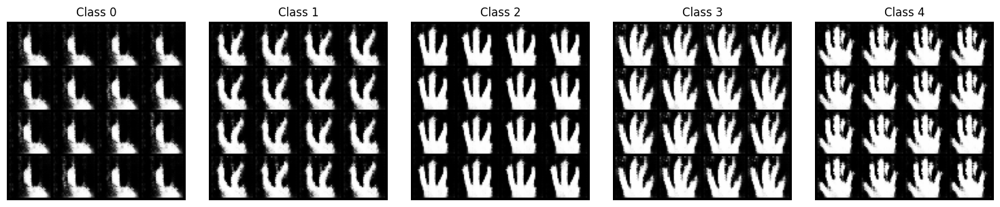

Epoch [11/50] Batch 0/13 D_loss: 0.5685, G_loss: 2.7176, D_acc: 0.9609
Epoch [11/50] Train - D_loss: 0.5980, G_loss: 2.4556, D_acc: 0.9100 | Val - D_loss: 1.1236, G_loss: 0.5497, D_acc: 0.5959
Epoch [12/50] Batch 0/13 D_loss: 0.9594, G_loss: 4.2146, D_acc: 0.5859
Epoch [12/50] Train - D_loss: 0.7565, G_loss: 2.6167, D_acc: 0.8141 | Val - D_loss: 0.8549, G_loss: 1.4324, D_acc: 0.8101
Epoch [13/50] Batch 0/13 D_loss: 0.7359, G_loss: 2.4233, D_acc: 0.8750
Epoch [13/50] Train - D_loss: 0.6106, G_loss: 2.4803, D_acc: 0.9158 | Val - D_loss: 0.6111, G_loss: 1.5841, D_acc: 0.9253
Epoch [14/50] Batch 0/13 D_loss: 0.4272, G_loss: 2.7178, D_acc: 0.9531
Epoch [14/50] Train - D_loss: 0.5307, G_loss: 2.6434, D_acc: 0.9322 | Val - D_loss: 0.8139, G_loss: 1.2202, D_acc: 0.9099
Epoch [15/50] Batch 0/13 D_loss: 0.6485, G_loss: 1.9709, D_acc: 0.8984
Epoch [15/50] Train - D_loss: 0.6250, G_loss: 2.7547, D_acc: 0.9095 | Val - D_loss: 0.5048, G_loss: 1.9881, D_acc: 0.8980
Epoch [16/50] Batch 0/13 D_loss: 0.

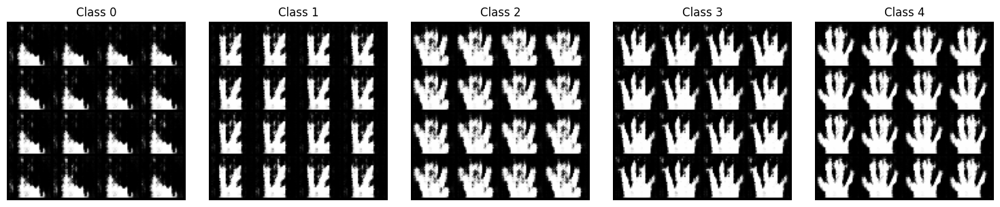

Epoch [21/50] Batch 0/13 D_loss: 0.7329, G_loss: 4.4154, D_acc: 0.9219
Epoch [21/50] Train - D_loss: 0.5215, G_loss: 3.0173, D_acc: 0.9288 | Val - D_loss: 0.9705, G_loss: 0.7121, D_acc: 0.6704
Epoch [22/50] Batch 0/13 D_loss: 0.4348, G_loss: 4.0219, D_acc: 0.9922
Epoch [22/50] Train - D_loss: 0.3805, G_loss: 3.0858, D_acc: 0.9633 | Val - D_loss: 0.3880, G_loss: 1.8309, D_acc: 0.9627
Epoch [23/50] Batch 0/13 D_loss: 0.3337, G_loss: 3.3718, D_acc: 0.9531
Epoch [23/50] Train - D_loss: 0.3154, G_loss: 3.0798, D_acc: 0.9600 | Val - D_loss: 0.7755, G_loss: 1.4572, D_acc: 0.8861
Epoch [24/50] Batch 0/13 D_loss: 0.2757, G_loss: 2.6791, D_acc: 0.9766
Epoch [24/50] Train - D_loss: 0.4379, G_loss: 3.3671, D_acc: 0.9202 | Val - D_loss: 0.7975, G_loss: 3.8398, D_acc: 0.8314
Epoch [25/50] Batch 0/13 D_loss: 0.7313, G_loss: 2.9820, D_acc: 0.8672
Epoch [25/50] Train - D_loss: 0.6207, G_loss: 3.3534, D_acc: 0.8680 | Val - D_loss: 1.1610, G_loss: 1.6817, D_acc: 0.5898
Epoch [26/50] Batch 0/13 D_loss: 0.

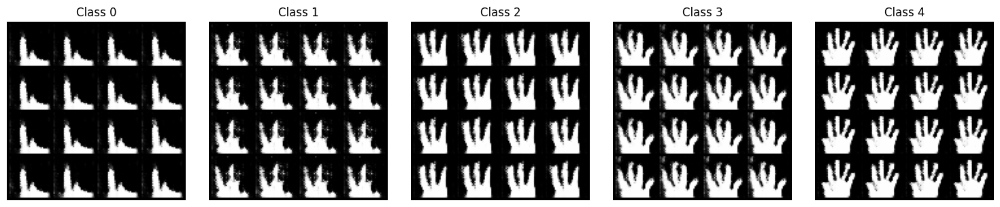

Epoch [31/50] Batch 0/13 D_loss: 0.4141, G_loss: 2.9906, D_acc: 0.9297
Epoch [31/50] Train - D_loss: 0.4527, G_loss: 3.1643, D_acc: 0.9384 | Val - D_loss: 0.4667, G_loss: 1.9434, D_acc: 0.9570
Epoch [32/50] Batch 0/13 D_loss: 0.3919, G_loss: 3.5929, D_acc: 0.9531
Epoch [32/50] Train - D_loss: 0.5315, G_loss: 3.2342, D_acc: 0.9109 | Val - D_loss: 0.5082, G_loss: 1.6419, D_acc: 0.9648
Epoch [33/50] Batch 0/13 D_loss: 0.4641, G_loss: 3.2639, D_acc: 0.9688
Epoch [33/50] Train - D_loss: 0.6604, G_loss: 3.6116, D_acc: 0.8560 | Val - D_loss: 0.4815, G_loss: 1.4794, D_acc: 0.9766
Epoch [34/50] Batch 0/13 D_loss: 0.4427, G_loss: 3.7938, D_acc: 0.9531
Epoch [34/50] Train - D_loss: 0.3895, G_loss: 3.2122, D_acc: 0.9497 | Val - D_loss: 0.6642, G_loss: 1.8317, D_acc: 0.8648
Epoch [35/50] Batch 0/13 D_loss: 0.3445, G_loss: 2.2181, D_acc: 0.9531
Epoch [35/50] Train - D_loss: 0.3768, G_loss: 2.9709, D_acc: 0.9609 | Val - D_loss: 0.4912, G_loss: 1.5575, D_acc: 0.9707
Epoch [36/50] Batch 0/13 D_loss: 0.

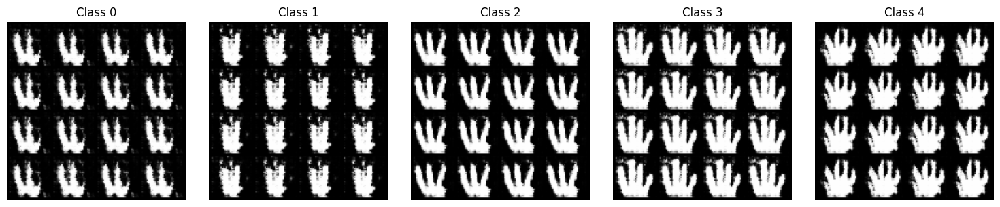

Epoch [41/50] Batch 0/13 D_loss: 0.3720, G_loss: 3.5127, D_acc: 0.9453
Epoch [41/50] Train - D_loss: 0.4966, G_loss: 3.5317, D_acc: 0.9000 | Val - D_loss: 0.2699, G_loss: 2.3670, D_acc: 0.9842
Epoch [42/50] Batch 0/13 D_loss: 0.3569, G_loss: 3.2863, D_acc: 0.9688
Epoch [42/50] Train - D_loss: 0.4692, G_loss: 3.3047, D_acc: 0.9218 | Val - D_loss: 0.3844, G_loss: 2.1541, D_acc: 0.9685
Epoch [43/50] Batch 0/13 D_loss: 0.4072, G_loss: 2.9164, D_acc: 0.9688
Epoch [43/50] Train - D_loss: 0.3559, G_loss: 3.1953, D_acc: 0.9599 | Val - D_loss: 0.5294, G_loss: 2.1709, D_acc: 0.8976
Epoch [44/50] Batch 0/13 D_loss: 0.4008, G_loss: 2.5276, D_acc: 0.9297
Epoch [44/50] Train - D_loss: 0.3815, G_loss: 3.3192, D_acc: 0.9510 | Val - D_loss: 0.4842, G_loss: 1.7634, D_acc: 0.9273
Epoch [45/50] Batch 0/13 D_loss: 0.3658, G_loss: 2.5506, D_acc: 0.9453
Epoch [45/50] Train - D_loss: 0.4958, G_loss: 3.8063, D_acc: 0.9101 | Val - D_loss: 0.4423, G_loss: 2.9336, D_acc: 0.9236
Epoch [46/50] Batch 0/13 D_loss: 0.

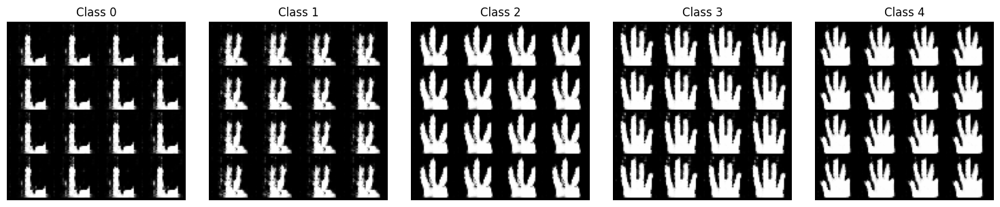

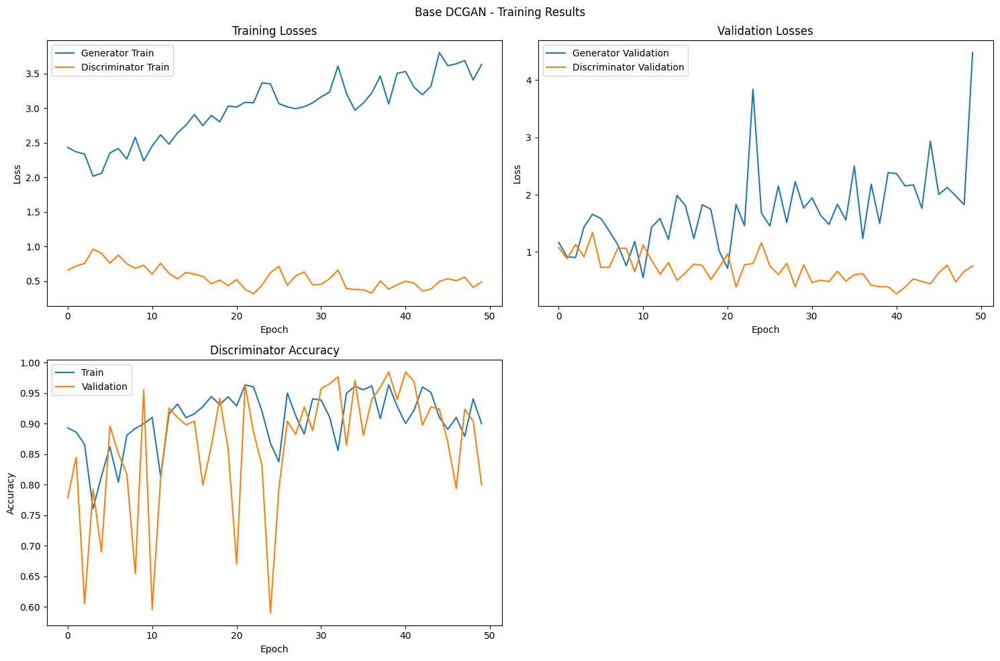

In [ ]:
# Base DCGAN
print("\n========== Training Base DCGAN ==========")
gen1, disc1, results1 = train_dcgan(label_smoothing=False, add_noise=False)

##### **Label Smoothing**

Label smoothing was introduced to reduce the discriminator's confidence:

* **Generator training loss remains high**, but more stable than the base.
* **Discriminator training accuracy drops to \~50%**, which is expected and desired—it means the discriminator is more uncertain, giving the generator room to improve.
* **Validation accuracy and losses fluctuate**, though the discriminator's performance seems slightly more balanced.

Overall, label smoothing **prevents discriminator overconfidence** and leads to a better adversarial dynamic, though generator performance is still unstable.


========== Training DCGAN with Label Smoothing ==========
Starting training for DCGAN with Label Smoothing
Configuration: label_smoothing=True, add_noise=False
Epoch [1/50] Batch 0/13 D_loss: 1.3796, G_loss: 1.6872, D_acc: 0.2031
Epoch [1/50] Train - D_loss: 0.7049, G_loss: 3.0069, D_acc: 0.4558 | Val - D_loss: 1.1005, G_loss: 1.4822, D_acc: 0.5469
Epoch [2/50] Batch 0/13 D_loss: 0.9762, G_loss: 2.5938, D_acc: 0.5000
Epoch [2/50] Train - D_loss: 0.7378, G_loss: 2.8929, D_acc: 0.4886 | Val - D_loss: 0.8931, G_loss: 1.5227, D_acc: 0.8268
Epoch [3/50] Batch 0/13 D_loss: 0.7830, G_loss: 3.1923, D_acc: 0.4453
Epoch [3/50] Train - D_loss: 0.7123, G_loss: 2.9003, D_acc: 0.4886 | Val - D_loss: 0.9961, G_loss: 1.3991, D_acc: 0.8014
Epoch [4/50] Batch 0/13 D_loss: 0.8356, G_loss: 2.8623, D_acc: 0.5000
Epoch [4/50] Train - D_loss: 0.9049, G_loss: 2.5557, D_acc: 0.4627 | Val - D_loss: 1.0467, G_loss: 1.6108, D_acc: 0.7548
Epoch [5/50] Batch 0/13 D_loss: 0.9513, G_loss: 1.2073, D_acc: 0.5000
Epoch

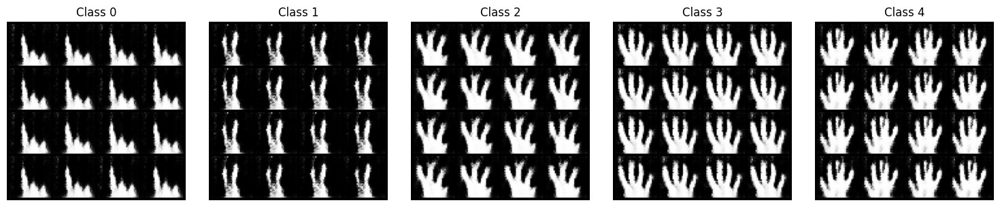

Epoch [11/50] Batch 0/13 D_loss: 1.4296, G_loss: 4.3303, D_acc: 0.1641
Epoch [11/50] Train - D_loss: 0.8841, G_loss: 2.7106, D_acc: 0.4549 | Val - D_loss: 0.4158, G_loss: 2.1076, D_acc: 0.9410
Epoch [12/50] Batch 0/13 D_loss: 0.5562, G_loss: 3.0900, D_acc: 0.5000
Epoch [12/50] Train - D_loss: 0.7097, G_loss: 2.6172, D_acc: 0.5000 | Val - D_loss: 0.7707, G_loss: 1.7815, D_acc: 0.8492
Epoch [13/50] Batch 0/13 D_loss: 0.7134, G_loss: 2.5258, D_acc: 0.5000
Epoch [13/50] Train - D_loss: 0.8437, G_loss: 2.3791, D_acc: 0.4922 | Val - D_loss: 1.0947, G_loss: 0.7970, D_acc: 0.7878
Epoch [14/50] Batch 0/13 D_loss: 0.8904, G_loss: 2.9717, D_acc: 0.4062
Epoch [14/50] Train - D_loss: 0.7080, G_loss: 2.8828, D_acc: 0.4898 | Val - D_loss: 0.6465, G_loss: 1.4560, D_acc: 0.9529
Epoch [15/50] Batch 0/13 D_loss: 0.6013, G_loss: 2.9165, D_acc: 0.5000
Epoch [15/50] Train - D_loss: 0.6510, G_loss: 2.8120, D_acc: 0.5000 | Val - D_loss: 0.9292, G_loss: 2.2520, D_acc: 0.7782
Epoch [16/50] Batch 0/13 D_loss: 0.

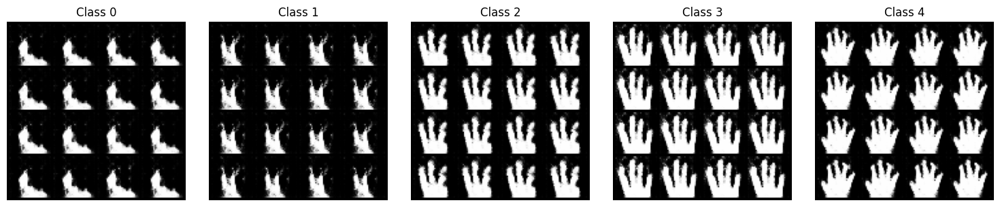

Epoch [21/50] Batch 0/13 D_loss: 0.8673, G_loss: 1.9990, D_acc: 0.5000
Epoch [21/50] Train - D_loss: 0.8149, G_loss: 2.4837, D_acc: 0.4814 | Val - D_loss: 0.4704, G_loss: 1.9976, D_acc: 0.9609
Epoch [22/50] Batch 0/13 D_loss: 0.5805, G_loss: 2.7141, D_acc: 0.5000
Epoch [22/50] Train - D_loss: 0.6909, G_loss: 2.6320, D_acc: 0.4976 | Val - D_loss: 0.6711, G_loss: 1.6555, D_acc: 0.9158
Epoch [23/50] Batch 0/13 D_loss: 0.6324, G_loss: 2.9748, D_acc: 0.5000
Epoch [23/50] Train - D_loss: 0.5831, G_loss: 2.9773, D_acc: 0.5000 | Val - D_loss: 0.5002, G_loss: 3.2446, D_acc: 0.9178
Epoch [24/50] Batch 0/13 D_loss: 0.5678, G_loss: 3.1871, D_acc: 0.5000
Epoch [24/50] Train - D_loss: 0.5652, G_loss: 3.0077, D_acc: 0.5000 | Val - D_loss: 0.7381, G_loss: 1.3575, D_acc: 0.8296
Epoch [25/50] Batch 0/13 D_loss: 0.7842, G_loss: 3.9828, D_acc: 0.4062
Epoch [25/50] Train - D_loss: 0.8827, G_loss: 2.9623, D_acc: 0.4609 | Val - D_loss: 0.7346, G_loss: 1.8522, D_acc: 0.8581
Epoch [26/50] Batch 0/13 D_loss: 0.

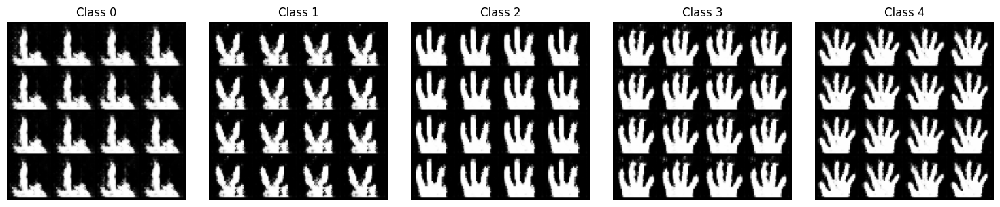

Epoch [31/50] Batch 0/13 D_loss: 0.6038, G_loss: 3.1203, D_acc: 0.5000
Epoch [31/50] Train - D_loss: 0.6456, G_loss: 2.9403, D_acc: 0.4934 | Val - D_loss: 0.7345, G_loss: 1.5931, D_acc: 0.8780
Epoch [32/50] Batch 0/13 D_loss: 0.5847, G_loss: 2.9775, D_acc: 0.5000
Epoch [32/50] Train - D_loss: 0.5956, G_loss: 3.0217, D_acc: 0.5000 | Val - D_loss: 0.6968, G_loss: 2.5533, D_acc: 0.8548
Epoch [33/50] Batch 0/13 D_loss: 0.5435, G_loss: 3.3022, D_acc: 0.5000
Epoch [33/50] Train - D_loss: 0.5361, G_loss: 3.1225, D_acc: 0.5000 | Val - D_loss: 0.6303, G_loss: 2.2922, D_acc: 0.8941
Epoch [34/50] Batch 0/13 D_loss: 0.6182, G_loss: 3.0566, D_acc: 0.5000
Epoch [34/50] Train - D_loss: 0.5627, G_loss: 3.0355, D_acc: 0.5000 | Val - D_loss: 0.5889, G_loss: 1.4707, D_acc: 0.9724
Epoch [35/50] Batch 0/13 D_loss: 0.6232, G_loss: 4.4525, D_acc: 0.5000
Epoch [35/50] Train - D_loss: 0.7195, G_loss: 3.3410, D_acc: 0.4874 | Val - D_loss: 0.9072, G_loss: 2.2761, D_acc: 0.8309
Epoch [36/50] Batch 0/13 D_loss: 0.

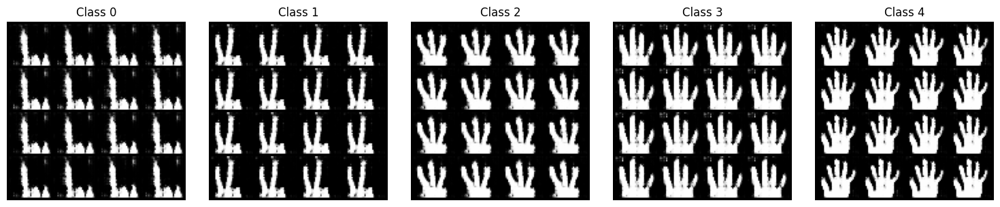

Epoch [41/50] Batch 0/13 D_loss: 0.7293, G_loss: 2.4567, D_acc: 0.5000
Epoch [41/50] Train - D_loss: 0.7774, G_loss: 2.6999, D_acc: 0.4958 | Val - D_loss: 0.6079, G_loss: 2.2537, D_acc: 0.8963
Epoch [42/50] Batch 0/13 D_loss: 0.7870, G_loss: 2.5325, D_acc: 0.5000
Epoch [42/50] Train - D_loss: 0.6956, G_loss: 2.9934, D_acc: 0.4994 | Val - D_loss: 0.7157, G_loss: 3.3109, D_acc: 0.8333
Epoch [43/50] Batch 0/13 D_loss: 0.6173, G_loss: 2.5852, D_acc: 0.5000
Epoch [43/50] Train - D_loss: 0.5714, G_loss: 3.0683, D_acc: 0.5000 | Val - D_loss: 0.7542, G_loss: 2.0290, D_acc: 0.8611
Epoch [44/50] Batch 0/13 D_loss: 0.5525, G_loss: 3.2437, D_acc: 0.5000
Epoch [44/50] Train - D_loss: 0.6933, G_loss: 3.1273, D_acc: 0.4832 | Val - D_loss: 0.6949, G_loss: 1.7534, D_acc: 0.9199
Epoch [45/50] Batch 0/13 D_loss: 0.6291, G_loss: 2.7946, D_acc: 0.5000
Epoch [45/50] Train - D_loss: 0.7236, G_loss: 3.0474, D_acc: 0.4886 | Val - D_loss: 0.5859, G_loss: 1.4705, D_acc: 0.9492
Epoch [46/50] Batch 0/13 D_loss: 0.

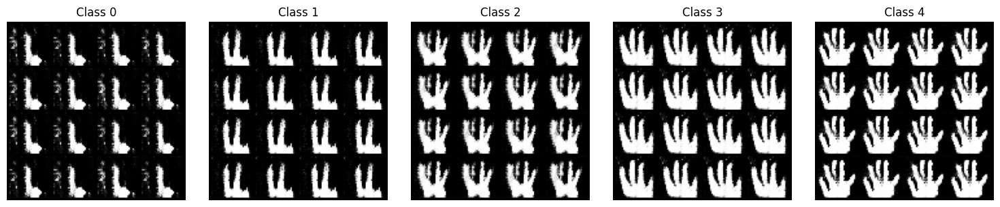

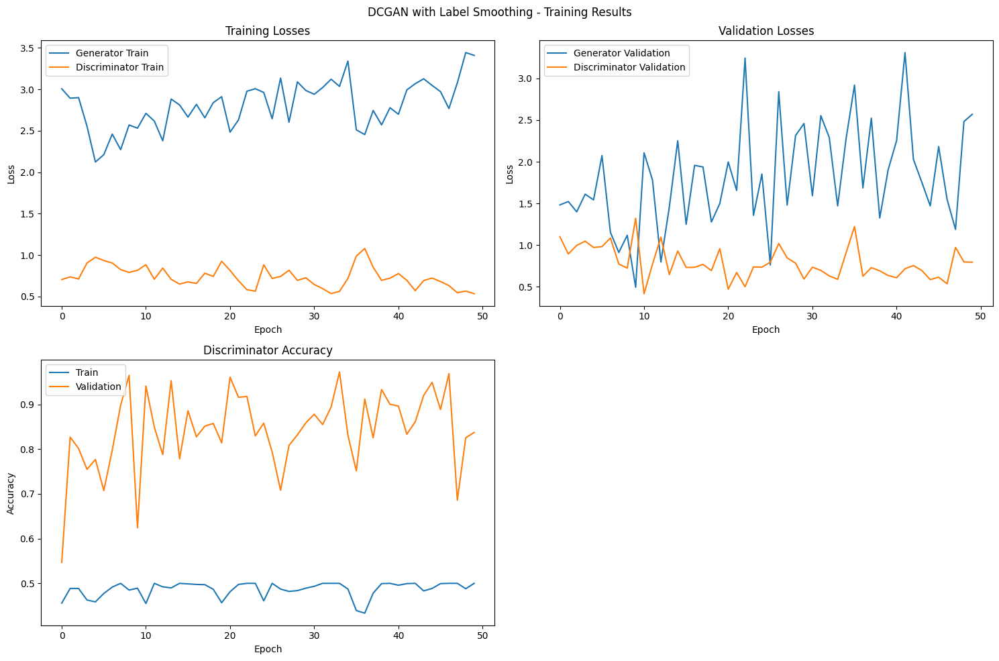

In [ ]:
# DCGAN with Label Smoothing
print("\n========== Training DCGAN with Label Smoothing ==========")
gen2, disc2, results2 = train_dcgan(label_smoothing=True, add_noise=False)

##### **Added Noise**

Adding noise to discriminator inputs acts as a regularizer:

* **Generator loss follows a similar trend to the base model**, though slightly more stable.
* **Discriminator accuracy stays around 85–95%**, with less fluctuation than the base, indicating **moderate regularization**.
* **Validation losses for the generator** are again spiky but less severe than the base.

This suggests that input noise **improves discriminator generalization slightly** and softens its dominance, but does not significantly improve generator learning on its own.


========== Training DCGAN with Added Noise ==========
Starting training for DCGAN with Added Noise
Configuration: label_smoothing=False, add_noise=True
Epoch [1/50] Batch 0/13 D_loss: 1.6094, G_loss: 1.2086, D_acc: 0.3125
Epoch [1/50] Train - D_loss: 0.7082, G_loss: 2.4795, D_acc: 0.8864 | Val - D_loss: 1.0677, G_loss: 1.0921, D_acc: 0.8785
Epoch [2/50] Batch 0/13 D_loss: 0.7189, G_loss: 1.2931, D_acc: 0.8438
Epoch [2/50] Train - D_loss: 0.6941, G_loss: 2.4609, D_acc: 0.8914 | Val - D_loss: 1.2197, G_loss: 0.9045, D_acc: 0.7470
Epoch [3/50] Batch 0/13 D_loss: 1.0156, G_loss: 2.4058, D_acc: 0.8516
Epoch [3/50] Train - D_loss: 0.9012, G_loss: 2.1203, D_acc: 0.7890 | Val - D_loss: 0.8664, G_loss: 1.3839, D_acc: 0.8338
Epoch [4/50] Batch 0/13 D_loss: 0.8265, G_loss: 1.5773, D_acc: 0.8516
Epoch [4/50] Train - D_loss: 0.9558, G_loss: 1.9104, D_acc: 0.7971 | Val - D_loss: 1.3712, G_loss: 0.5947, D_acc: 0.4933
Epoch [5/50] Batch 0/13 D_loss: 1.0987, G_loss: 1.8692, D_acc: 0.7734
Epoch [5/50] 

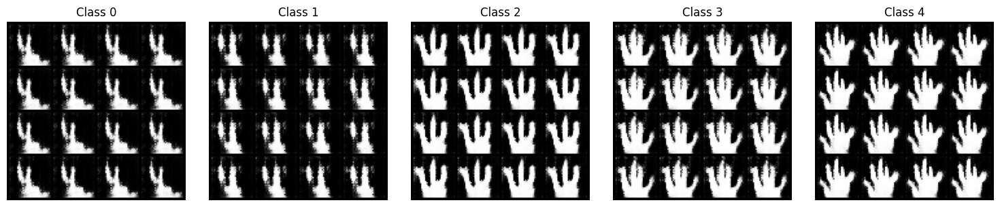

Epoch [11/50] Batch 0/13 D_loss: 0.5526, G_loss: 2.5064, D_acc: 0.9766
Epoch [11/50] Train - D_loss: 0.6337, G_loss: 2.3792, D_acc: 0.9215 | Val - D_loss: 0.9292, G_loss: 1.8323, D_acc: 0.8160
Epoch [12/50] Batch 0/13 D_loss: 0.8313, G_loss: 1.6927, D_acc: 0.7656
Epoch [12/50] Train - D_loss: 0.5166, G_loss: 2.5640, D_acc: 0.9255 | Val - D_loss: 0.4608, G_loss: 1.6563, D_acc: 0.9531
Epoch [13/50] Batch 0/13 D_loss: 0.3844, G_loss: 2.7699, D_acc: 0.9766
Epoch [13/50] Train - D_loss: 0.5910, G_loss: 2.5918, D_acc: 0.9159 | Val - D_loss: 0.5262, G_loss: 1.3651, D_acc: 0.9570
Epoch [14/50] Batch 0/13 D_loss: 0.4537, G_loss: 2.9730, D_acc: 0.9297
Epoch [14/50] Train - D_loss: 0.4077, G_loss: 2.7856, D_acc: 0.9556 | Val - D_loss: 0.7522, G_loss: 1.4970, D_acc: 0.8349
Epoch [15/50] Batch 0/13 D_loss: 0.7108, G_loss: 4.7275, D_acc: 0.8125
Epoch [15/50] Train - D_loss: 0.5729, G_loss: 2.9861, D_acc: 0.8965 | Val - D_loss: 0.9136, G_loss: 2.2915, D_acc: 0.8116
Epoch [16/50] Batch 0/13 D_loss: 0.

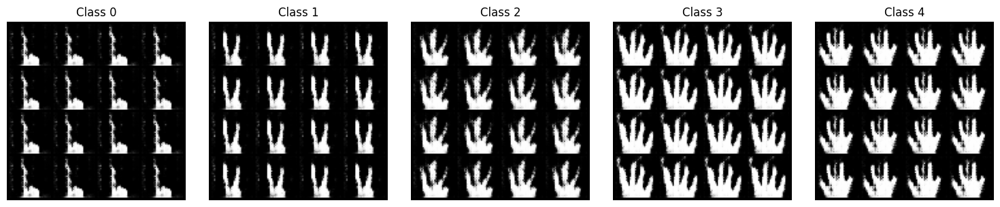

Epoch [21/50] Batch 0/13 D_loss: 0.7613, G_loss: 2.2242, D_acc: 0.8438
Epoch [21/50] Train - D_loss: 0.7282, G_loss: 2.2728, D_acc: 0.8709 | Val - D_loss: 0.6816, G_loss: 1.2549, D_acc: 0.9099
Epoch [22/50] Batch 0/13 D_loss: 0.5265, G_loss: 2.0175, D_acc: 0.9062
Epoch [22/50] Train - D_loss: 0.6254, G_loss: 2.6997, D_acc: 0.8757 | Val - D_loss: 0.4619, G_loss: 2.0766, D_acc: 0.9375
Epoch [23/50] Batch 0/13 D_loss: 0.4257, G_loss: 2.7171, D_acc: 0.9297
Epoch [23/50] Train - D_loss: 0.4938, G_loss: 2.6833, D_acc: 0.9324 | Val - D_loss: 0.8158, G_loss: 1.1472, D_acc: 0.8034
Epoch [24/50] Batch 0/13 D_loss: 0.4933, G_loss: 2.9147, D_acc: 0.9219
Epoch [24/50] Train - D_loss: 0.3444, G_loss: 2.8434, D_acc: 0.9713 | Val - D_loss: 0.5822, G_loss: 1.6163, D_acc: 0.9117
Epoch [25/50] Batch 0/13 D_loss: 0.3577, G_loss: 3.0844, D_acc: 0.9453
Epoch [25/50] Train - D_loss: 0.5072, G_loss: 3.2222, D_acc: 0.9149 | Val - D_loss: 0.5737, G_loss: 1.4974, D_acc: 0.8885
Epoch [26/50] Batch 0/13 D_loss: 0.

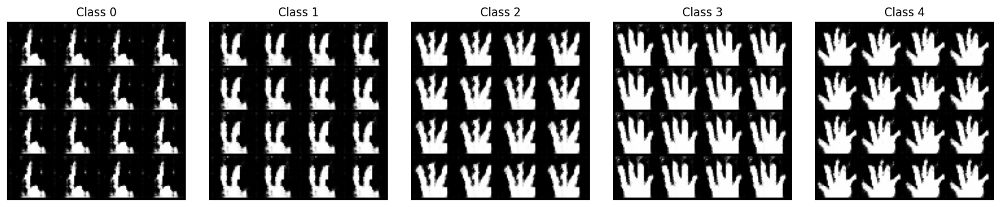

Epoch [31/50] Batch 0/13 D_loss: 0.6896, G_loss: 3.3377, D_acc: 0.8516
Epoch [31/50] Train - D_loss: 0.5068, G_loss: 3.0897, D_acc: 0.9109 | Val - D_loss: 0.6554, G_loss: 2.2122, D_acc: 0.8806
Epoch [32/50] Batch 0/13 D_loss: 0.4178, G_loss: 2.3787, D_acc: 0.9141
Epoch [32/50] Train - D_loss: 0.4265, G_loss: 3.2209, D_acc: 0.9388 | Val - D_loss: 0.5525, G_loss: 2.1190, D_acc: 0.8802
Epoch [33/50] Batch 0/13 D_loss: 0.4482, G_loss: 2.5405, D_acc: 0.9297
Epoch [33/50] Train - D_loss: 0.5987, G_loss: 3.4375, D_acc: 0.8886 | Val - D_loss: 0.5322, G_loss: 1.7659, D_acc: 0.9412
Epoch [34/50] Batch 0/13 D_loss: 0.2991, G_loss: 3.1005, D_acc: 0.9922
Epoch [34/50] Train - D_loss: 0.6385, G_loss: 3.2072, D_acc: 0.8685 | Val - D_loss: 0.6348, G_loss: 1.4553, D_acc: 0.8240
Epoch [35/50] Batch 0/13 D_loss: 0.5336, G_loss: 3.1239, D_acc: 0.8438
Epoch [35/50] Train - D_loss: 0.4773, G_loss: 3.1031, D_acc: 0.9137 | Val - D_loss: 0.6907, G_loss: 3.4698, D_acc: 0.8785
Epoch [36/50] Batch 0/13 D_loss: 0.

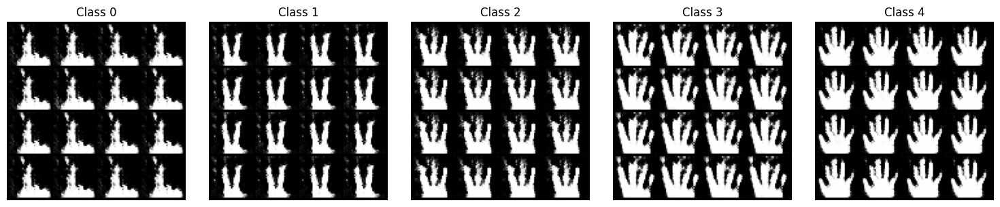

Epoch [41/50] Batch 0/13 D_loss: 0.2992, G_loss: 2.7002, D_acc: 0.9766
Epoch [41/50] Train - D_loss: 0.4725, G_loss: 3.3150, D_acc: 0.9095 | Val - D_loss: 0.5819, G_loss: 2.1494, D_acc: 0.8416
Epoch [42/50] Batch 0/13 D_loss: 0.3909, G_loss: 4.8203, D_acc: 0.9688
Epoch [42/50] Train - D_loss: 0.6081, G_loss: 3.6531, D_acc: 0.8789 | Val - D_loss: 0.5518, G_loss: 1.6294, D_acc: 0.9115
Epoch [43/50] Batch 0/13 D_loss: 0.3885, G_loss: 4.3838, D_acc: 0.9766
Epoch [43/50] Train - D_loss: 0.4111, G_loss: 3.5436, D_acc: 0.9481 | Val - D_loss: 0.5073, G_loss: 2.9533, D_acc: 0.8921
Epoch [44/50] Batch 0/13 D_loss: 0.3048, G_loss: 2.5899, D_acc: 0.9609
Epoch [44/50] Train - D_loss: 0.3571, G_loss: 3.3246, D_acc: 0.9533 | Val - D_loss: 0.5156, G_loss: 1.9871, D_acc: 0.8743
Epoch [45/50] Batch 0/13 D_loss: 0.6548, G_loss: 3.3112, D_acc: 0.8516
Epoch [45/50] Train - D_loss: 0.5536, G_loss: 3.2316, D_acc: 0.8962 | Val - D_loss: 0.7480, G_loss: 1.6013, D_acc: 0.7669
Epoch [46/50] Batch 0/13 D_loss: 0.

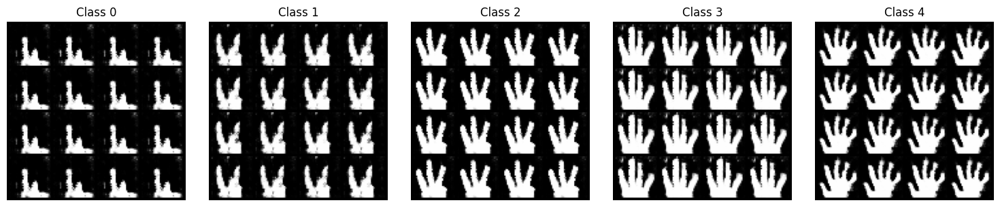

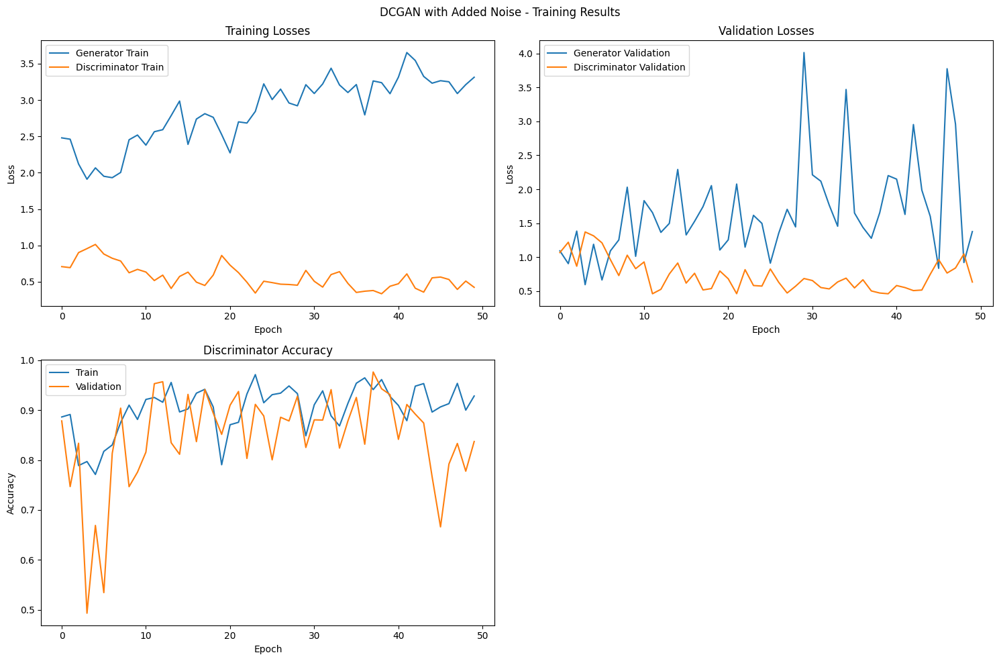

In [ ]:
# DCGAN with Added Noise
print("\n========== Training DCGAN with Added Noise ==========")
gen3, disc3, results3 = train_dcgan(label_smoothing=False, add_noise=True)

##### **Both Techniques**

Combining label smoothing and noise yields the most promising results:

* **Generator loss is relatively stable**, without severe spikes.
* **Discriminator training accuracy is suppressed (\~45–50%)**, a sign of reduced overfitting.
* **Validation accuracy shows more stability** compared to other configurations.
* **Validation losses for both models fluctuate**, but overall variation is reduced compared to the base model.

This combined strategy leads to the **most balanced adversarial training**, where neither model dominates and learning is more stable.


========== Training DCGAN with Both Techniques ==========
Starting training for DCGAN with Both Techniques
Configuration: label_smoothing=True, add_noise=True
Epoch [1/50] Batch 0/13 D_loss: 1.4155, G_loss: 1.8594, D_acc: 0.1641
Epoch [1/50] Train - D_loss: 0.7605, G_loss: 2.7818, D_acc: 0.4645 | Val - D_loss: 1.0930, G_loss: 0.6540, D_acc: 0.6122
Epoch [2/50] Batch 0/13 D_loss: 1.2555, G_loss: 4.9017, D_acc: 0.0859
Epoch [2/50] Train - D_loss: 0.8182, G_loss: 2.9038, D_acc: 0.4669 | Val - D_loss: 0.8604, G_loss: 1.4361, D_acc: 0.8681
Epoch [3/50] Batch 0/13 D_loss: 0.6781, G_loss: 2.7361, D_acc: 0.5000
Epoch [3/50] Train - D_loss: 0.9099, G_loss: 2.5969, D_acc: 0.4495 | Val - D_loss: 0.8747, G_loss: 0.9281, D_acc: 0.9373
Epoch [4/50] Batch 0/13 D_loss: 0.8513, G_loss: 2.4897, D_acc: 0.4844
Epoch [4/50] Train - D_loss: 0.8858, G_loss: 2.2601, D_acc: 0.4885 | Val - D_loss: 1.1034, G_loss: 1.8493, D_acc: 0.7105
Epoch [5/50] Batch 0/13 D_loss: 0.9651, G_loss: 1.3870, D_acc: 0.5000
Epoch 

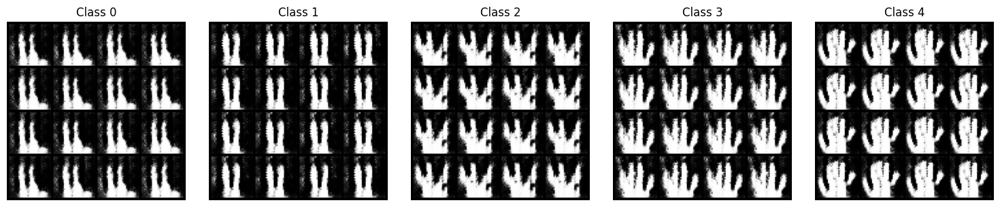

Epoch [11/50] Batch 0/13 D_loss: 0.8686, G_loss: 3.0828, D_acc: 0.5000
Epoch [11/50] Train - D_loss: 0.6725, G_loss: 2.6194, D_acc: 0.5000 | Val - D_loss: 0.4989, G_loss: 1.7251, D_acc: 0.9648
Epoch [12/50] Batch 0/13 D_loss: 0.6053, G_loss: 2.3305, D_acc: 0.5000
Epoch [12/50] Train - D_loss: 0.6358, G_loss: 2.5993, D_acc: 0.5000 | Val - D_loss: 0.8475, G_loss: 1.6051, D_acc: 0.8349
Epoch [13/50] Batch 0/13 D_loss: 0.6779, G_loss: 2.9304, D_acc: 0.5000
Epoch [13/50] Train - D_loss: 0.7056, G_loss: 2.6483, D_acc: 0.5000 | Val - D_loss: 0.6129, G_loss: 1.2738, D_acc: 0.9488
Epoch [14/50] Batch 0/13 D_loss: 0.7722, G_loss: 3.8873, D_acc: 0.5000
Epoch [14/50] Train - D_loss: 0.7283, G_loss: 2.7414, D_acc: 0.4892 | Val - D_loss: 0.8087, G_loss: 1.0140, D_acc: 0.9036
Epoch [15/50] Batch 0/13 D_loss: 0.9041, G_loss: 2.8370, D_acc: 0.4922
Epoch [15/50] Train - D_loss: 0.7601, G_loss: 2.6015, D_acc: 0.4910 | Val - D_loss: 0.5495, G_loss: 2.1638, D_acc: 0.8963
Epoch [16/50] Batch 0/13 D_loss: 0.

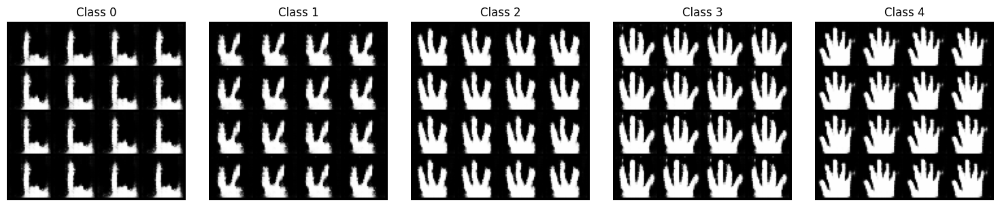

Epoch [21/50] Batch 0/13 D_loss: 0.7235, G_loss: 1.7614, D_acc: 0.5000
Epoch [21/50] Train - D_loss: 0.7252, G_loss: 2.5528, D_acc: 0.5000 | Val - D_loss: 1.0191, G_loss: 1.2195, D_acc: 0.6992
Epoch [22/50] Batch 0/13 D_loss: 1.2237, G_loss: 2.8892, D_acc: 0.2891
Epoch [22/50] Train - D_loss: 0.8149, G_loss: 2.5328, D_acc: 0.4826 | Val - D_loss: 0.7844, G_loss: 1.2201, D_acc: 0.9002
Epoch [23/50] Batch 0/13 D_loss: 0.7014, G_loss: 2.7270, D_acc: 0.5000
Epoch [23/50] Train - D_loss: 0.6748, G_loss: 2.5188, D_acc: 0.5000 | Val - D_loss: 0.8642, G_loss: 1.4180, D_acc: 0.8494
Epoch [24/50] Batch 0/13 D_loss: 0.6182, G_loss: 2.8876, D_acc: 0.5000
Epoch [24/50] Train - D_loss: 0.5721, G_loss: 2.9206, D_acc: 0.5000 | Val - D_loss: 0.5709, G_loss: 2.5384, D_acc: 0.8824
Epoch [25/50] Batch 0/13 D_loss: 0.5877, G_loss: 2.5585, D_acc: 0.5000
Epoch [25/50] Train - D_loss: 0.6529, G_loss: 2.7659, D_acc: 0.4982 | Val - D_loss: 0.3863, G_loss: 1.9999, D_acc: 0.9805
Epoch [26/50] Batch 0/13 D_loss: 0.

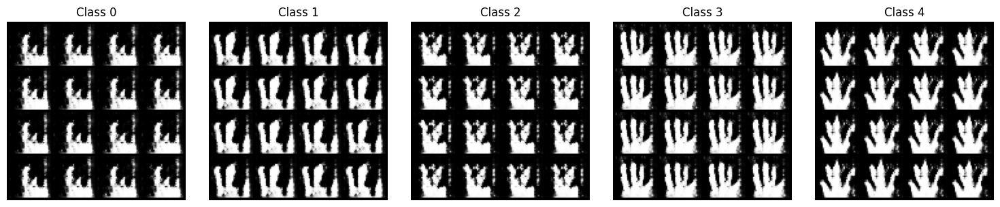

Epoch [31/50] Batch 0/13 D_loss: 0.6228, G_loss: 2.9130, D_acc: 0.5000
Epoch [31/50] Train - D_loss: 0.6746, G_loss: 3.1501, D_acc: 0.4936 | Val - D_loss: 1.0544, G_loss: 2.9280, D_acc: 0.7448
Epoch [32/50] Batch 0/13 D_loss: 0.8638, G_loss: 2.0624, D_acc: 0.5000
Epoch [32/50] Train - D_loss: 0.8701, G_loss: 2.8755, D_acc: 0.4586 | Val - D_loss: 0.7107, G_loss: 2.2703, D_acc: 0.8665
Epoch [33/50] Batch 0/13 D_loss: 0.7706, G_loss: 2.5124, D_acc: 0.5000
Epoch [33/50] Train - D_loss: 0.8647, G_loss: 2.7129, D_acc: 0.4880 | Val - D_loss: 1.1243, G_loss: 0.7139, D_acc: 0.6827
Epoch [34/50] Batch 0/13 D_loss: 1.0457, G_loss: 3.9267, D_acc: 0.2578
Epoch [34/50] Train - D_loss: 0.8929, G_loss: 2.7011, D_acc: 0.4585 | Val - D_loss: 0.5543, G_loss: 1.5020, D_acc: 0.9412
Epoch [35/50] Batch 0/13 D_loss: 0.7796, G_loss: 2.6139, D_acc: 0.5000
Epoch [35/50] Train - D_loss: 0.7390, G_loss: 2.7491, D_acc: 0.4988 | Val - D_loss: 0.6496, G_loss: 2.5263, D_acc: 0.8631
Epoch [36/50] Batch 0/13 D_loss: 0.

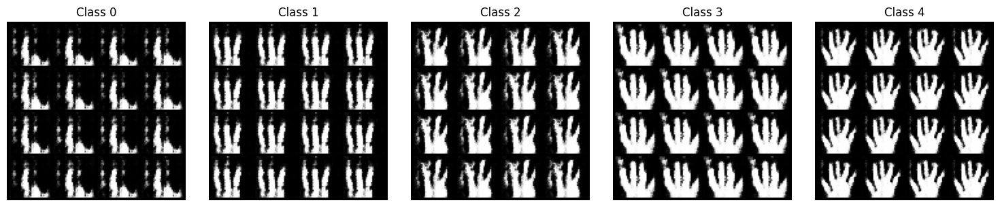

Epoch [41/50] Batch 0/13 D_loss: 0.6542, G_loss: 3.3158, D_acc: 0.5000
Epoch [41/50] Train - D_loss: 0.5739, G_loss: 3.0920, D_acc: 0.4994 | Val - D_loss: 0.4101, G_loss: 2.0428, D_acc: 0.9609
Epoch [42/50] Batch 0/13 D_loss: 0.5118, G_loss: 3.0922, D_acc: 0.5000
Epoch [42/50] Train - D_loss: 0.5504, G_loss: 3.2347, D_acc: 0.5000 | Val - D_loss: 0.7512, G_loss: 1.9811, D_acc: 0.8001
Epoch [43/50] Batch 0/13 D_loss: 0.6940, G_loss: 2.5006, D_acc: 0.4219
Epoch [43/50] Train - D_loss: 0.7031, G_loss: 2.9333, D_acc: 0.4838 | Val - D_loss: 0.8090, G_loss: 1.2130, D_acc: 0.8062
Epoch [44/50] Batch 0/13 D_loss: 0.8960, G_loss: 4.8033, D_acc: 0.3438
Epoch [44/50] Train - D_loss: 0.8108, G_loss: 2.9280, D_acc: 0.4694 | Val - D_loss: 0.6276, G_loss: 1.0517, D_acc: 0.8296
Epoch [45/50] Batch 0/13 D_loss: 0.8753, G_loss: 4.5075, D_acc: 0.3906
Epoch [45/50] Train - D_loss: 0.7236, G_loss: 3.0117, D_acc: 0.4772 | Val - D_loss: 0.7356, G_loss: 1.2593, D_acc: 0.7724
Epoch [46/50] Batch 0/13 D_loss: 0.

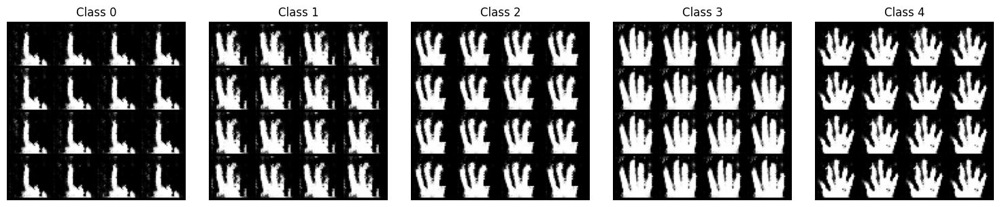

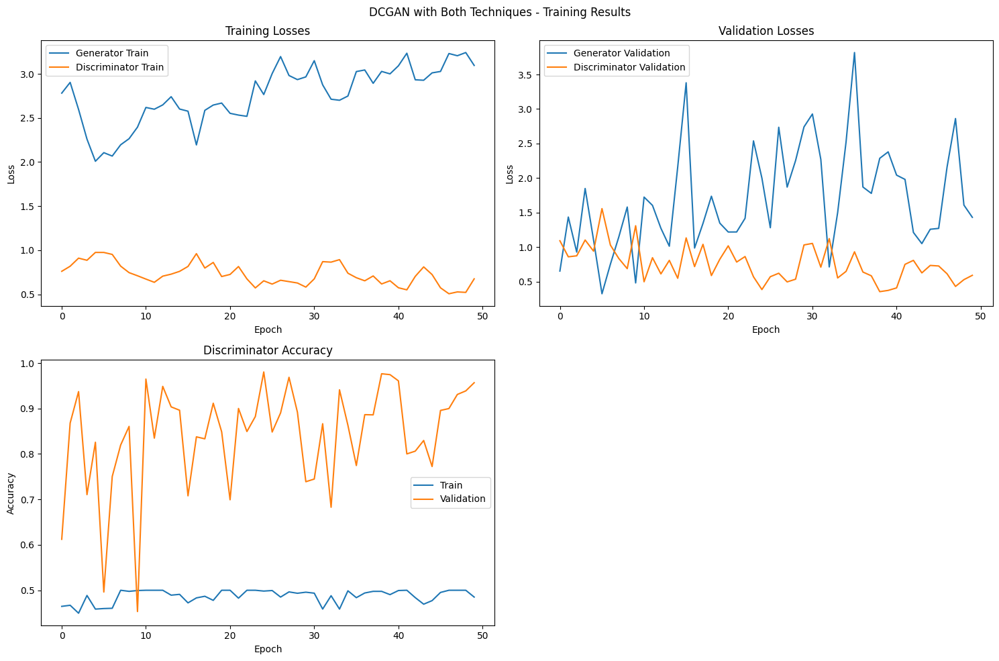

In [ ]:
# DCGAN with Both Techniques
print("\n========== Training DCGAN with Both Techniques ==========")
gen4, disc4, results4 = train_dcgan(label_smoothing=True, add_noise=True)

#### <font face="Verdana" color="green" size="+2">**Part 7: Compare Results Across All Configurations**





========== Comparing All Results ==========


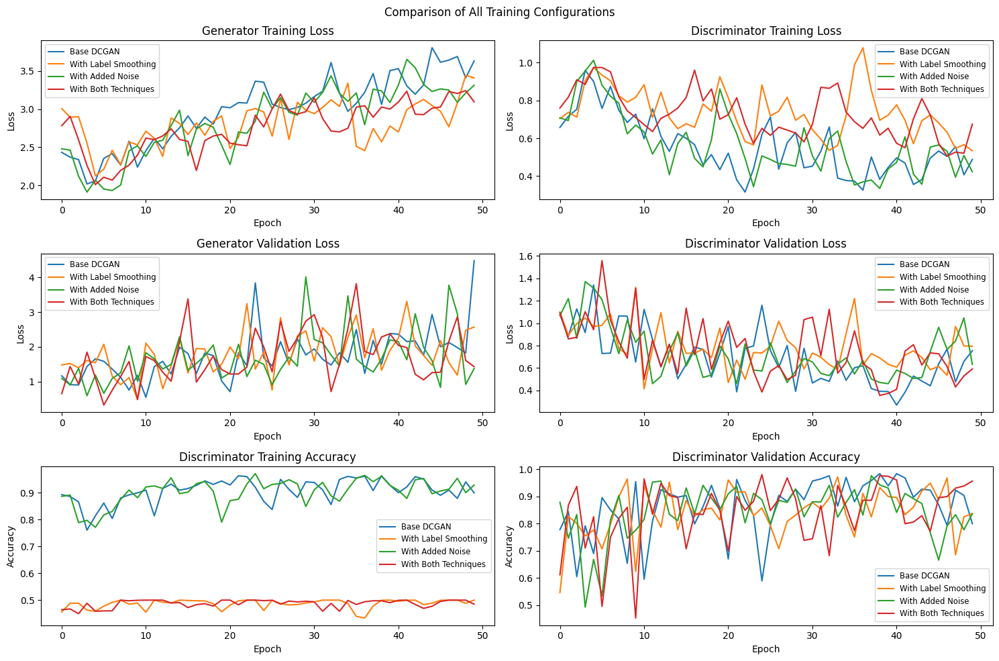


========== Displaying Generated Images from All Models ==========


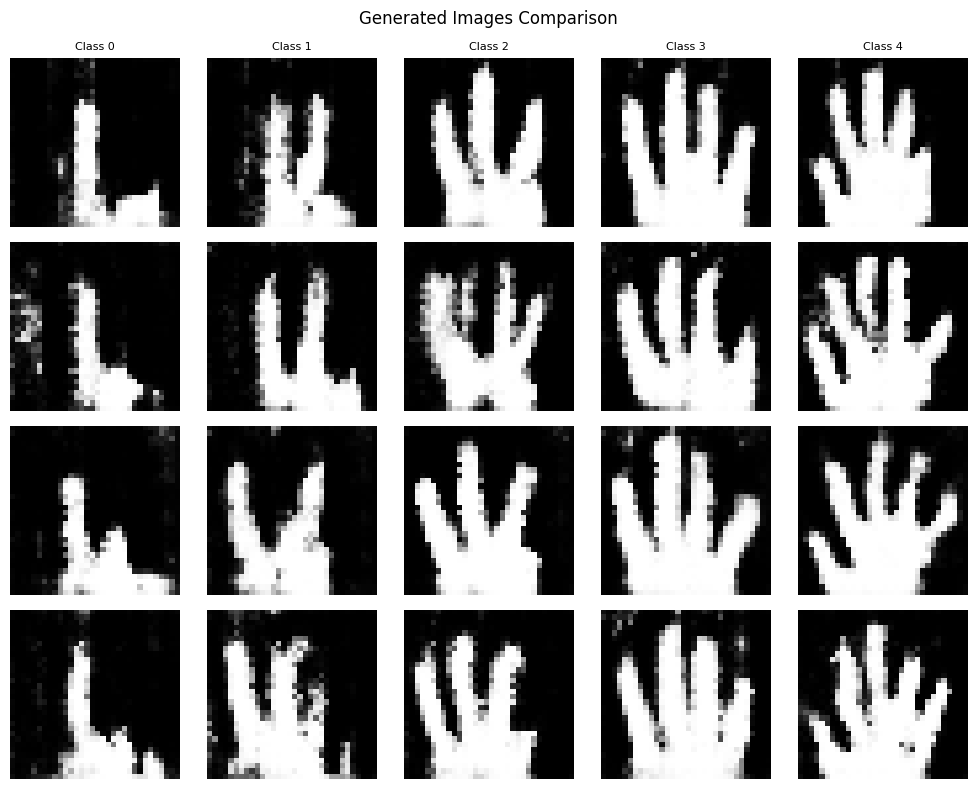

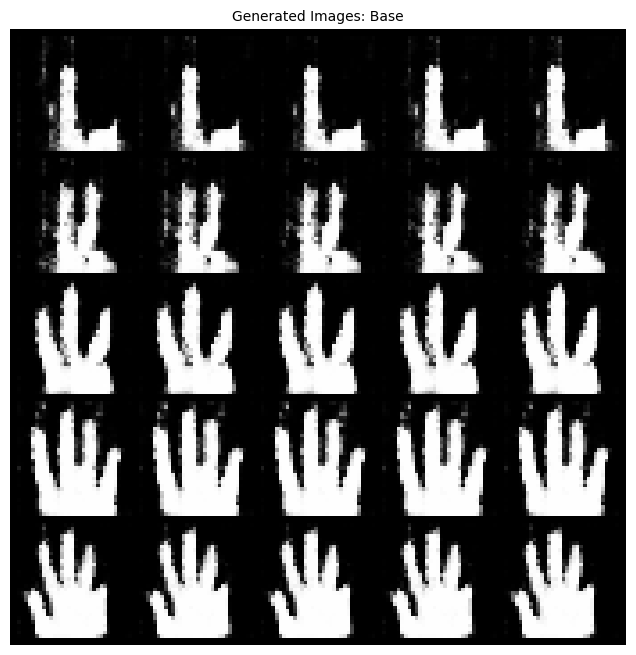

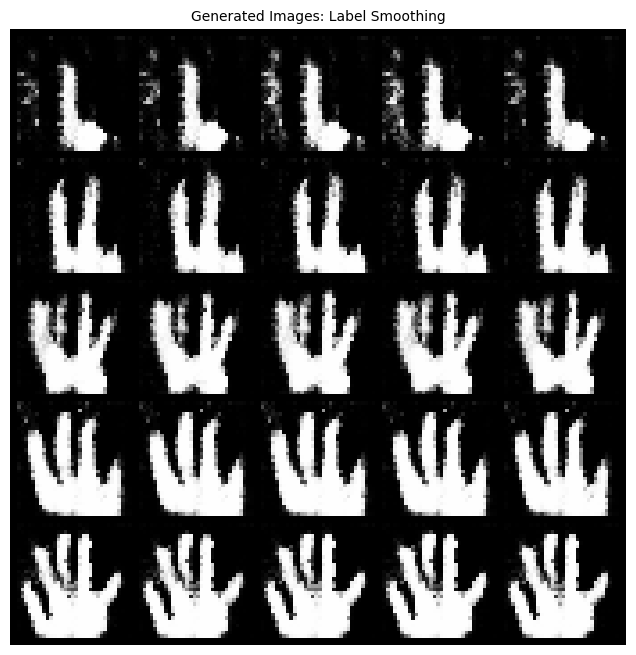

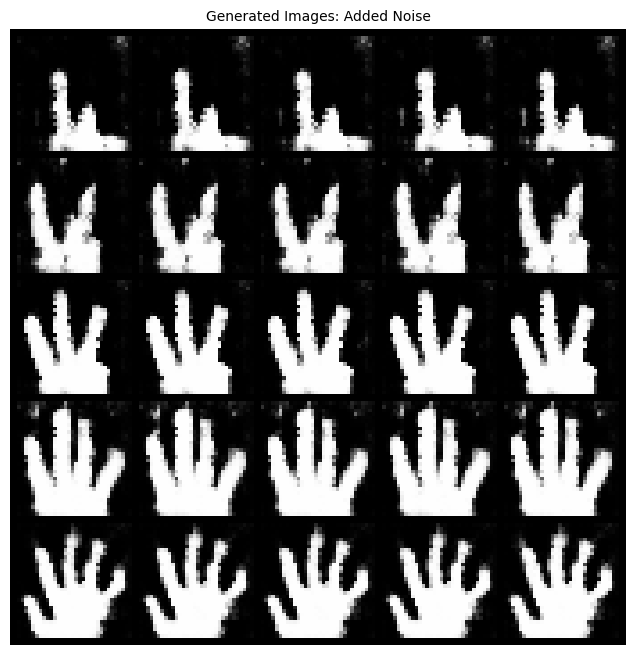

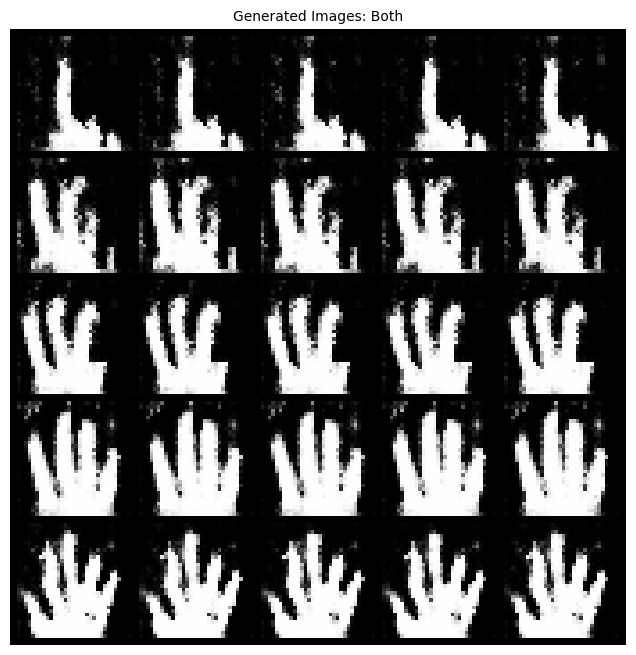

In [ ]:
# Compare results across all configurations
def compare_all_results(results):
    # Unpack results
    results1, results2, results3, results4 = results
    train_g1, train_d1, val_g1, val_d1, train_acc1, val_acc1 = results1
    train_g2, train_d2, val_g2, val_d2, train_acc2, val_acc2 = results2
    train_g3, train_d3, val_g3, val_d3, train_acc3, val_acc3 = results3
    train_g4, train_d4, val_g4, val_d4, train_acc4, val_acc4 = results4

    # Compare loss curves
    plt.figure(figsize=(15, 10))

    # Generator Training Loss
    plt.subplot(3, 2, 1)
    plt.plot(train_g1, label='Base DCGAN')
    plt.plot(train_g2, label='With Label Smoothing')
    plt.plot(train_g3, label='With Added Noise')
    plt.plot(train_g4, label='With Both Techniques')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Generator Training Loss')
    plt.legend(fontsize='small')

    # Discriminator Training Loss
    plt.subplot(3, 2, 2)
    plt.plot(train_d1, label='Base DCGAN')
    plt.plot(train_d2, label='With Label Smoothing')
    plt.plot(train_d3, label='With Added Noise')
    plt.plot(train_d4, label='With Both Techniques')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Discriminator Training Loss')
    plt.legend(fontsize='small')

    # Generator Validation Loss
    plt.subplot(3, 2, 3)
    plt.plot(val_g1, label='Base DCGAN')
    plt.plot(val_g2, label='With Label Smoothing')
    plt.plot(val_g3, label='With Added Noise')
    plt.plot(val_g4, label='With Both Techniques')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Generator Validation Loss')
    plt.legend(fontsize='small')

    # Discriminator Validation Loss
    plt.subplot(3, 2, 4)
    plt.plot(val_d1, label='Base DCGAN')
    plt.plot(val_d2, label='With Label Smoothing')
    plt.plot(val_d3, label='With Added Noise')
    plt.plot(val_d4, label='With Both Techniques')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Discriminator Validation Loss')
    plt.legend(fontsize='small')

    # Discriminator Training Accuracy
    plt.subplot(3, 2, 5)
    plt.plot(train_acc1, label='Base DCGAN')
    plt.plot(train_acc2, label='With Label Smoothing')
    plt.plot(train_acc3, label='With Added Noise')
    plt.plot(train_acc4, label='With Both Techniques')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Discriminator Training Accuracy')
    plt.legend(fontsize='small')

    # Discriminator Validation Accuracy
    plt.subplot(3, 2, 6)
    plt.plot(val_acc1, label='Base DCGAN')
    plt.plot(val_acc2, label='With Label Smoothing')
    plt.plot(val_acc3, label='With Added Noise')
    plt.plot(val_acc4, label='With Both Techniques')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Discriminator Validation Accuracy')
    plt.legend(fontsize='small')

    plt.suptitle("Comparison of All Training Configurations")
    plt.tight_layout()
    plt.show()

# Compare all results
print("\n========== Comparing All Results ==========")
compare_all_results([results1, results2, results3, results4])

# Display side-by-side generated images from all models
def display_all_models_generated_images(generators):
    # Generate fixed noise
    fixed_batch_size = 1  # 1 image per class
    fixed_noise = torch.randn(fixed_batch_size * num_classes, latent_dim, device=device)
    fixed_class_labels = torch.tensor([i for i in range(num_classes) for _ in range(fixed_batch_size)], device=device)

    fig, axs = plt.subplots(len(generators), num_classes, figsize=(10, 8))
    model_names = ['Base', 'Label Smoothing', 'Added Noise', 'Both']

    for model_idx, gen in enumerate(generators):
        gen.eval()
        with torch.no_grad():
            fake = gen(fixed_noise, fixed_class_labels)

        for class_idx in range(num_classes):
            # Extract images of this class
            class_indices = (fixed_class_labels == class_idx)
            fake_class = fake[class_indices]

            # Display one image for this class
            sample = fake_class[0].cpu()

            # Display in appropriate subplot
            axs[model_idx, class_idx].imshow(sample[0], cmap='gray')

            # Add titles and turn off axes
            if class_idx == 0:
                axs[model_idx, class_idx].set_ylabel(model_names[model_idx], fontsize=8)
            if model_idx == 0:
                axs[model_idx, class_idx].set_title(f"Class {class_idx}", fontsize=8)

            axs[model_idx, class_idx].axis('off')

    plt.suptitle("Generated Images Comparison")
    plt.tight_layout()
    plt.show()

    # Also display per-model image grids for better viewing
    for model_idx, gen in enumerate(generators):
        gen.eval()
        with torch.no_grad():
            # Generate more images for a better grid
            noise = torch.randn(25, latent_dim, device=device)
            # Create 5 images for each class
            class_labels = torch.tensor([i for i in range(num_classes) for _ in range(5)], device=device)
            fake = gen(noise, class_labels)

        # Create a grid of the generated images
        plt.figure(figsize=(8, 8))
        plt.title(f"Generated Images: {model_names[model_idx]}", fontsize=10)
        grid = make_grid(fake.cpu(), nrow=5, normalize=True)
        plt.imshow(np.transpose(grid, (1, 2, 0)), cmap='gray')
        plt.axis('off')
        plt.show()

# Display generated images from all models
print("\n========== Displaying Generated Images from All Models ==========")
display_all_models_generated_images([gen1, gen2, gen3, gen4])

##### **Analyze**

**1. Generator Training Loss**

All configurations show an upward trend in generator loss, but with different behaviors:

* The **base DCGAN** exhibits the **highest and steepest rise**, indicating poor adaptation.
* **Label smoothing** and **added noise** slightly reduce this trend, with **label smoothing** being the most stable.
* The **combined technique** results in the **lowest generator training loss**, showing better learning dynamics.

✅ **Conclusion:** Applying both techniques leads to a more stable and efficient generator training process.

---

**2. Discriminator Training Loss**

* The **base model** shows a sharp decline in loss, implying overconfidence.
* **Label smoothing** and **added noise** help maintain moderate discriminator loss.
* The **combined approach** results in **more stable fluctuations**, without a steep drop.

✅ **Conclusion:** Regularization techniques prevent the discriminator from converging too quickly, maintaining the adversarial balance.

---

**3. Generator Validation Loss**

* Validation losses are noisy across all models, which is expected due to GAN instability.
* The **combined method** consistently exhibits **lower and more stable validation loss**, compared to others.
* The **base model** and **added noise only** configurations show more spikes and instability.

✅ **Conclusion:** Combining label smoothing and noise enhances generator generalization and reduces validation error.

---

**4. Discriminator Validation Loss**

* The **base DCGAN** shows a steady decrease but with high variance.
* All regularized models show **more stable trends**, with the **combined model** achieving the most consistent performance.

✅ **Conclusion:** Regularization improves the generalization of the discriminator on unseen data.

---

**5. Discriminator Training Accuracy**

* The **base model** and **noise-only** configuration reach high accuracy (\~95%), reflecting discriminator dominance.
* **Label smoothing** and **combined techniques** keep training accuracy around **50%**, which is ideal in adversarial learning as it reflects a balanced competition.

✅ **Conclusion:** Label smoothing effectively prevents discriminator overfitting and overconfidence.

---

**6. Discriminator Validation Accuracy**

* All models fluctuate, but the **combined configuration** remains relatively consistent with **balanced accuracy** (\~80–90%).
* The **base DCGAN** has high validation accuracy but is paired with poor generator performance, confirming imbalance.

✅ **Conclusion:** A balanced validation accuracy in the combined setup suggests healthier GAN dynamics.


